In [1]:
!nvidia-smi

Sat Jul  3 11:25:47 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# Mounting the drive and copying the code from github to drive
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
!git clone https://github.com/anilbhatt1/Deep_Learning_EVA6_Phase1
%cd Deep_Learning_EVA6_Phase1/src
! ls

Cloning into 'Deep_Learning_EVA6_Phase1'...
remote: Enumerating objects: 416, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 416 (delta 42), reused 0 (delta 0), pack-reused 340
Receiving objects: 100% (416/416), 9.56 MiB | 23.54 MiB/s, done.
Resolving deltas: 100% (216/216), done.
/content/Deep_Learning_EVA6_Phase1/src
Alb_transforms.py  README.md	s8_resnet_cifar10_model.py  train_loss.py
models.py	   s7_model.py	test_loss.py		    utilities.py


In [4]:
!pip install albumentations==1.0.0

     |████████████████████████████████| 102kB 7.1MB/s 
     |████████████████████████████████| 38.2MB 78kB/s 
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import cv2
import PIL
from PIL import Image as img
from tqdm import tqdm
import matplotlib.pyplot as plt
import albumentations as A
cuda = torch.cuda.is_available()
import datetime
from torch.utils.tensorboard import SummaryWriter
print(f'Albumentations Version : {A.__version__}, Pytorch Version : {torch.__version__}, cuda:{cuda}')
%load_ext tensorboard

Albumentations Version : 1.0.0, Pytorch Version : 1.9.0+cu102, cuda:True


In [6]:
# Import required src files
import s8_resnet_cifar10_model, utilities, train_loss, test_loss

In [19]:
# Data Augmentation & data loader stuff to be handled
trainloader, testloader = utilities.CIFAR10_data_prep()

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:645: FutureWarning: This class has been deprecated. Please use CoarseDropout
  FutureWarning,


Files already downloaded and verified
Files already downloaded and verified


In [20]:
img_save_path = '/content/gdrive/MyDrive/EVA6_P1_S8/'

tb_writer = utilities.create_tensorboard_writer(img_save_path)

plot = utilities.cifar10_plots(img_save_path, tb_writer)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


images.size() : torch.Size([128, 3, 32, 32]), labels.size() : torch.Size([128])


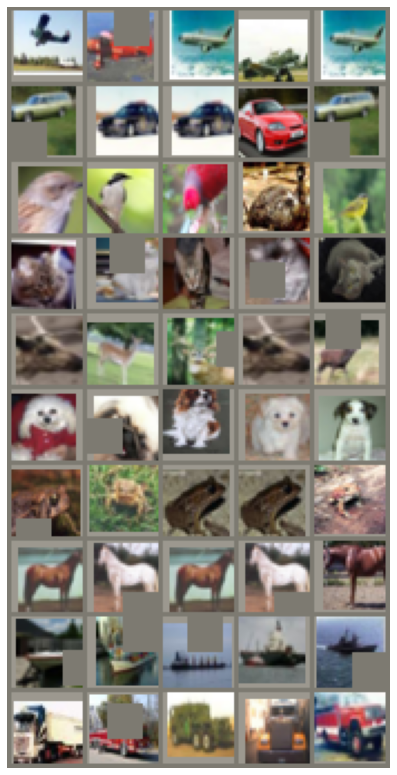

In [21]:
# Train-data to be displayed
plot.plot_cifar10_train_imgs(trainloader)

In [22]:
%tensorboard --logdir /content/gdrive/MyDrive/EVA6_P1_S8
#%tensorboard --logdir runs

Reusing TensorBoard on port 6006 (pid 307), started 0:09:34 ago. (Use '!kill 307' to kill it.)

<IPython.core.display.Javascript object>

In [23]:
!pip install torchsummary
from torchsummary import summary
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)

cuda


In [24]:
model = s8_resnet_cifar10_model.ResNet18().to(device)
summary(model, input_size=(3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
        GroupNorm-14          [-1, 128,

In [25]:
img = torch.ones(1, 3, 32, 32)
img = img.to(device)
tb_writer.add_graph(model, img)

In [26]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

  0%|          | 0/391 [00:00<?, ?it/s]

EPOCH: 0


Loss=2.0165774822235107 Batch_id=390 Train Accuracy=16.73: 100%|██████████| 391/391 [01:04<00:00,  6.05it/s]

Train set: Epoch : 0/40 Average loss: 2.0166, Train Accuracy: 16.73



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 0/40 Average loss: 1.9422, Test Accuracy: 27.22
EPOCH: 1


Loss=2.00856351852417 Batch_id=390 Train Accuracy=27.16: 100%|██████████| 391/391 [01:07<00:00,  5.82it/s]

Train set: Epoch : 1/40 Average loss: 2.0086, Train Accuracy: 27.16



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 1/40 Average loss: 1.8979, Test Accuracy: 29.58
EPOCH: 2


Loss=1.5721609592437744 Batch_id=390 Train Accuracy=35.24: 100%|██████████| 391/391 [01:08<00:00,  5.69it/s]

Train set: Epoch : 2/40 Average loss: 1.5722, Train Accuracy: 35.24



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 2/40 Average loss: 1.5938, Test Accuracy: 41.3
EPOCH: 3


Loss=1.6447036266326904 Batch_id=390 Train Accuracy=41.05: 100%|██████████| 391/391 [01:10<00:00,  5.56it/s]

Train set: Epoch : 3/40 Average loss: 1.6447, Train Accuracy: 41.05



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 3/40 Average loss: 1.4163, Test Accuracy: 48.6
EPOCH: 4


Loss=1.2296133041381836 Batch_id=390 Train Accuracy=46.90: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 4/40 Average loss: 1.2296, Train Accuracy: 46.9



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 4/40 Average loss: 1.2967, Test Accuracy: 52.2
EPOCH: 5


Loss=1.252070665359497 Batch_id=390 Train Accuracy=51.48: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 5/40 Average loss: 1.2521, Train Accuracy: 51.48



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 5/40 Average loss: 1.1395, Test Accuracy: 58.84
EPOCH: 6


Loss=1.0816643238067627 Batch_id=390 Train Accuracy=56.32: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 6/40 Average loss: 1.0817, Train Accuracy: 56.32



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 6/40 Average loss: 1.0642, Test Accuracy: 61.5
EPOCH: 7


Loss=1.0098682641983032 Batch_id=390 Train Accuracy=59.26: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 7/40 Average loss: 1.0099, Train Accuracy: 59.26



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 7/40 Average loss: 0.9894, Test Accuracy: 64.98
EPOCH: 8


Loss=0.9322702288627625 Batch_id=390 Train Accuracy=62.59: 100%|██████████| 391/391 [01:11<00:00,  5.49it/s]

Train set: Epoch : 8/40 Average loss: 0.9323, Train Accuracy: 62.59



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 8/40 Average loss: 0.9393, Test Accuracy: 66.02
EPOCH: 9


Loss=1.1409423351287842 Batch_id=390 Train Accuracy=64.90: 100%|██████████| 391/391 [01:11<00:00,  5.49it/s]

Train set: Epoch : 9/40 Average loss: 1.1409, Train Accuracy: 64.9



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 9/40 Average loss: 0.9246, Test Accuracy: 67.42
EPOCH: 10


Loss=0.9380678534507751 Batch_id=390 Train Accuracy=67.60: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 10/40 Average loss: 0.9381, Train Accuracy: 67.6



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 10/40 Average loss: 0.7701, Test Accuracy: 72.57
EPOCH: 11


Loss=0.8797929286956787 Batch_id=390 Train Accuracy=70.09: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 11/40 Average loss: 0.8798, Train Accuracy: 70.09



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 11/40 Average loss: 0.7312, Test Accuracy: 74.56
EPOCH: 12


Loss=0.6506882905960083 Batch_id=390 Train Accuracy=71.56: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 12/40 Average loss: 0.6507, Train Accuracy: 71.56



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 12/40 Average loss: 0.7025, Test Accuracy: 75.79
EPOCH: 13


Loss=0.7104188799858093 Batch_id=390 Train Accuracy=73.76: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 13/40 Average loss: 0.7104, Train Accuracy: 73.76



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 13/40 Average loss: 0.7402, Test Accuracy: 74.1
EPOCH: 14


Loss=0.7995262742042542 Batch_id=390 Train Accuracy=74.52: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 14/40 Average loss: 0.7995, Train Accuracy: 74.52



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 14/40 Average loss: 0.6507, Test Accuracy: 77.73
EPOCH: 15


Loss=0.6990280747413635 Batch_id=390 Train Accuracy=76.24: 100%|██████████| 391/391 [01:11<00:00,  5.48it/s]

Train set: Epoch : 15/40 Average loss: 0.6990, Train Accuracy: 76.24



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 15/40 Average loss: 0.6082, Test Accuracy: 79.29
EPOCH: 16


Loss=0.7209436297416687 Batch_id=390 Train Accuracy=77.32: 100%|██████████| 391/391 [01:11<00:00,  5.48it/s]

Train set: Epoch : 16/40 Average loss: 0.7209, Train Accuracy: 77.32



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 16/40 Average loss: 0.5757, Test Accuracy: 80.06
EPOCH: 17


Loss=0.673786461353302 Batch_id=390 Train Accuracy=78.85: 100%|██████████| 391/391 [01:11<00:00,  5.49it/s]

Train set: Epoch : 17/40 Average loss: 0.6738, Train Accuracy: 78.85



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 17/40 Average loss: 0.5449, Test Accuracy: 81.78
EPOCH: 18


Loss=0.4342523515224457 Batch_id=390 Train Accuracy=79.31: 100%|██████████| 391/391 [01:11<00:00,  5.48it/s]

Train set: Epoch : 18/40 Average loss: 0.4343, Train Accuracy: 79.31



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 18/40 Average loss: 0.6135, Test Accuracy: 79.35
EPOCH: 19


Loss=0.5346025228500366 Batch_id=390 Train Accuracy=79.95: 100%|██████████| 391/391 [01:11<00:00,  5.49it/s]

Train set: Epoch : 19/40 Average loss: 0.5346, Train Accuracy: 79.95



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 19/40 Average loss: 0.5745, Test Accuracy: 80.8
EPOCH: 20


Loss=0.5330797433853149 Batch_id=390 Train Accuracy=81.02: 100%|██████████| 391/391 [01:11<00:00,  5.48it/s]

Train set: Epoch : 20/40 Average loss: 0.5331, Train Accuracy: 81.02



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 20/40 Average loss: 0.5795, Test Accuracy: 80.59
EPOCH: 21


Loss=0.7474973201751709 Batch_id=390 Train Accuracy=81.72: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 21/40 Average loss: 0.7475, Train Accuracy: 81.72



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 21/40 Average loss: 0.5078, Test Accuracy: 82.59
EPOCH: 22


Loss=0.49189284443855286 Batch_id=390 Train Accuracy=82.62: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 22/40 Average loss: 0.4919, Train Accuracy: 82.62



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 22/40 Average loss: 0.4525, Test Accuracy: 85.01
EPOCH: 23


Loss=0.4388948678970337 Batch_id=390 Train Accuracy=82.98: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 23/40 Average loss: 0.4389, Train Accuracy: 82.98



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 23/40 Average loss: 0.4380, Test Accuracy: 85.29
EPOCH: 24


Loss=0.5734694004058838 Batch_id=390 Train Accuracy=83.64: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 24/40 Average loss: 0.5735, Train Accuracy: 83.64



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 24/40 Average loss: 0.4787, Test Accuracy: 84.09
EPOCH: 25


Loss=0.27087005972862244 Batch_id=390 Train Accuracy=84.33: 100%|██████████| 391/391 [01:11<00:00,  5.50it/s]

Train set: Epoch : 25/40 Average loss: 0.2709, Train Accuracy: 84.33



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 25/40 Average loss: 0.4014, Test Accuracy: 86.44
EPOCH: 26


Loss=0.6138924956321716 Batch_id=390 Train Accuracy=85.03: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 26/40 Average loss: 0.6139, Train Accuracy: 85.03



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 26/40 Average loss: 0.4089, Test Accuracy: 86.08
EPOCH: 27


Loss=0.4708663821220398 Batch_id=390 Train Accuracy=85.43: 100%|██████████| 391/391 [01:11<00:00,  5.49it/s]

Train set: Epoch : 27/40 Average loss: 0.4709, Train Accuracy: 85.43



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 27/40 Average loss: 0.4102, Test Accuracy: 86.3
EPOCH: 28


Loss=0.35517242550849915 Batch_id=390 Train Accuracy=85.99: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 28/40 Average loss: 0.3552, Train Accuracy: 85.99



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 28/40 Average loss: 0.4347, Test Accuracy: 85.72
EPOCH: 29


Loss=0.37987229228019714 Batch_id=390 Train Accuracy=86.38: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 29/40 Average loss: 0.3799, Train Accuracy: 86.38



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 29/40 Average loss: 0.3932, Test Accuracy: 86.92
EPOCH: 30


Loss=0.3123089373111725 Batch_id=390 Train Accuracy=86.86: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 30/40 Average loss: 0.3123, Train Accuracy: 86.86



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 30/40 Average loss: 0.4240, Test Accuracy: 86.35
EPOCH: 31


Loss=0.4389391541481018 Batch_id=390 Train Accuracy=87.27: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 31/40 Average loss: 0.4389, Train Accuracy: 87.27



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 31/40 Average loss: 0.4184, Test Accuracy: 86.01
EPOCH: 32


Loss=0.36471027135849 Batch_id=390 Train Accuracy=87.72: 100%|██████████| 391/391 [01:11<00:00,  5.50it/s]

Train set: Epoch : 32/40 Average loss: 0.3647, Train Accuracy: 87.72



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 32/40 Average loss: 0.4382, Test Accuracy: 85.59
EPOCH: 33


Loss=0.30486664175987244 Batch_id=390 Train Accuracy=87.95: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 33/40 Average loss: 0.3049, Train Accuracy: 87.95



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 33/40 Average loss: 0.4009, Test Accuracy: 86.56
EPOCH: 34


Loss=0.20194290578365326 Batch_id=390 Train Accuracy=88.52: 100%|██████████| 391/391 [01:11<00:00,  5.47it/s]

Train set: Epoch : 34/40 Average loss: 0.2019, Train Accuracy: 88.52



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 34/40 Average loss: 0.3897, Test Accuracy: 87.03
EPOCH: 35


Loss=0.5288525223731995 Batch_id=390 Train Accuracy=89.22: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 35/40 Average loss: 0.5289, Train Accuracy: 89.22



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 35/40 Average loss: 0.4107, Test Accuracy: 86.52
EPOCH: 36


Loss=0.4064844250679016 Batch_id=390 Train Accuracy=89.30: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 36/40 Average loss: 0.4065, Train Accuracy: 89.3



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 36/40 Average loss: 0.3800, Test Accuracy: 87.95
EPOCH: 37


Loss=0.349073201417923 Batch_id=390 Train Accuracy=89.64: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 37/40 Average loss: 0.3491, Train Accuracy: 89.64



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 37/40 Average loss: 0.3611, Test Accuracy: 88.26
EPOCH: 38


Loss=0.21325081586837769 Batch_id=390 Train Accuracy=89.81: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 38/40 Average loss: 0.2133, Train Accuracy: 89.81



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 38/40 Average loss: 0.3632, Test Accuracy: 88.08
EPOCH: 39


Loss=0.3293113708496094 Batch_id=390 Train Accuracy=90.26: 100%|██████████| 391/391 [01:11<00:00,  5.46it/s]

Train set: Epoch : 39/40 Average loss: 0.3293, Train Accuracy: 90.26


Test set: Epoch : 39/40 Average loss: 0.3940, Test Accuracy: 87.37
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


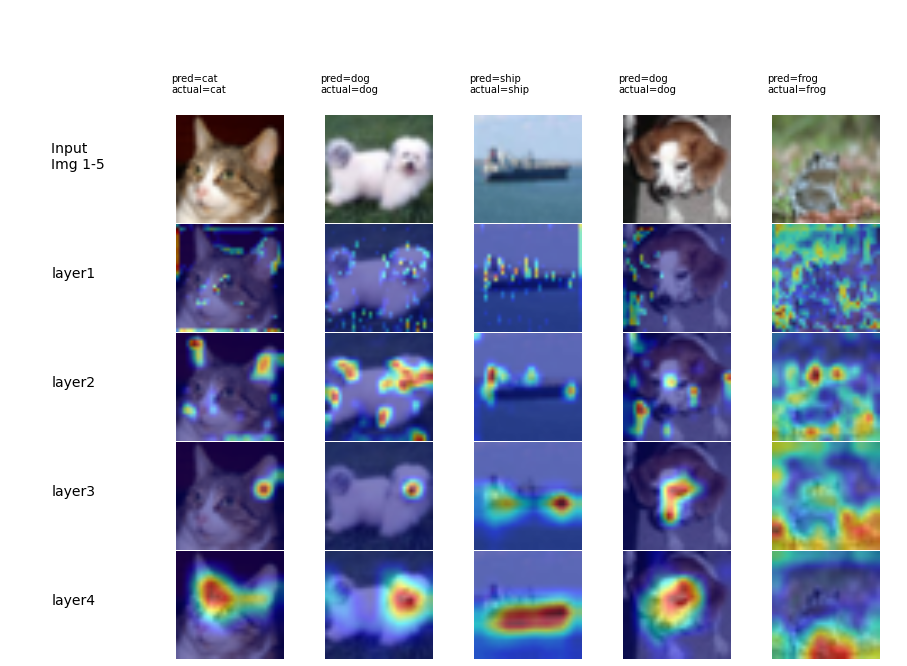

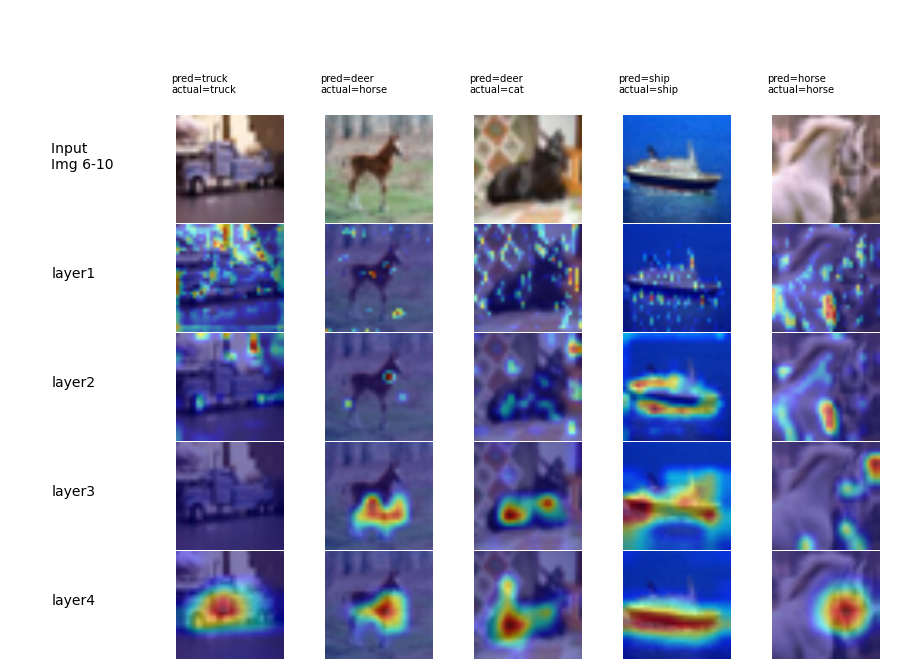

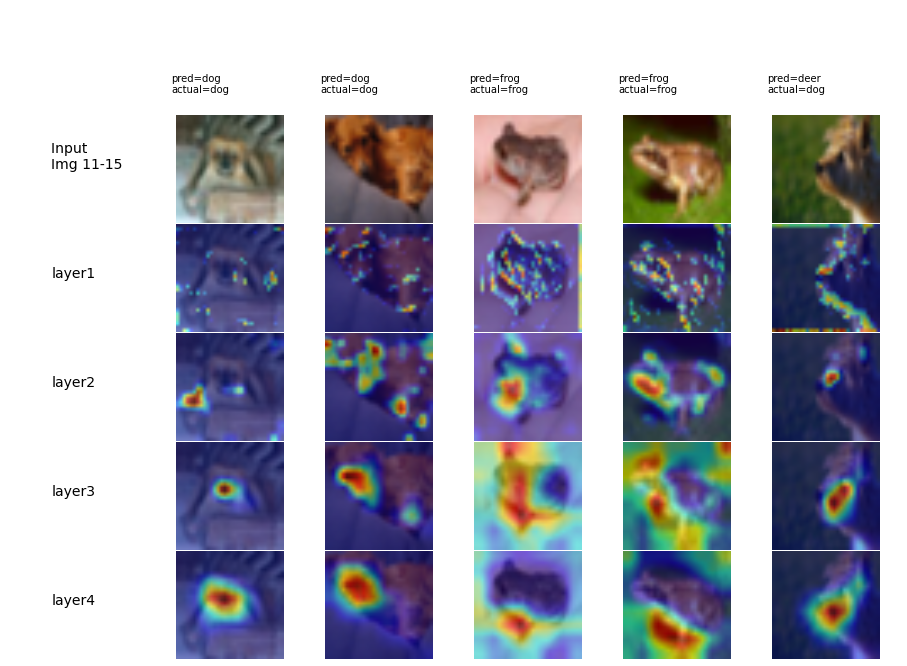

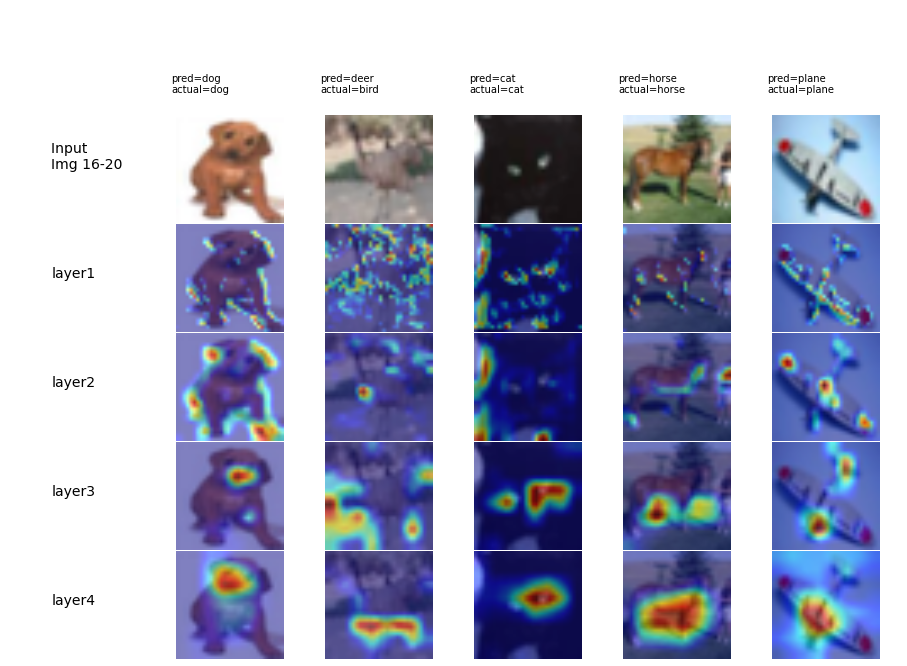

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


** Plotting misclassified test images from last epoch for CIFAR-10 **




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


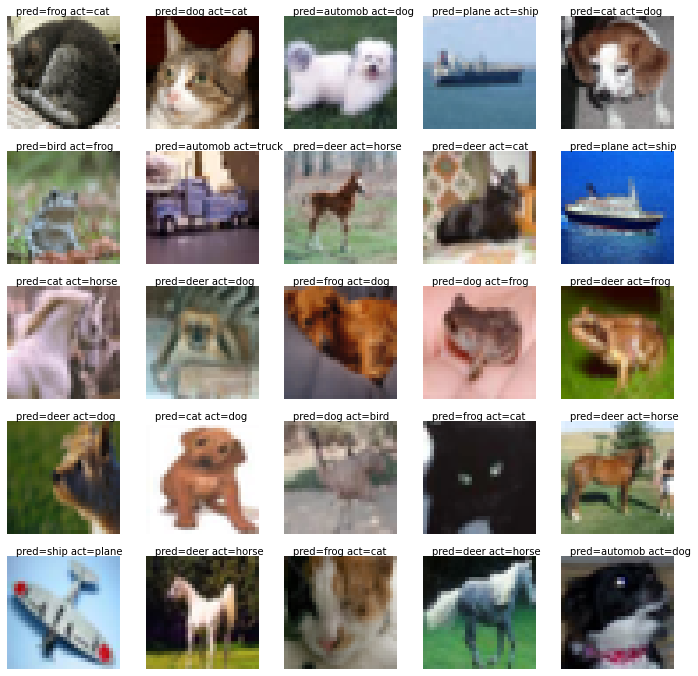

In [27]:
EPOCHS = 40
model = s8_resnet_cifar10_model.ResNet18().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.025, momentum=0.8, weight_decay = 0)
scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, min_lr=1e-7, patience = 4, verbose=True)
stats = utilities.ctr()
train = train_loss.train_losses(model, device, trainloader, stats, optimizer, EPOCHS)
test  = test_loss.test_losses(model, device, testloader, stats, EPOCHS)

for epoch in range(EPOCHS):
    print(f'EPOCH: {epoch}')
    train.s8_train(epoch, scheduler, tb_writer, L1_factor=0.0005)
    test.s8_test(epoch, scheduler, optimizer, tb_writer)  

details = utilities.counters 

images         = details['mis_img'][1:21]
target_classes = details['mis_lbl'][1:21]
target_layers  = ["layer1", "layer2", "layer3", "layer4"]
gradcam_output, probs, predicted_classes = utilities.GRADCAM(images, target_classes, model, target_layers)

disp_grid = [(0,5), (5,10), (10, 15), (15,20)]
for disp_range in disp_grid:
    plot.plot_cifar10_gradcam_imgs(gradcam_output, images, target_classes, target_layers, predicted_classes, disp_range)

num_images = 25
plot.plot_cifar10_misclassified(details, num_images)

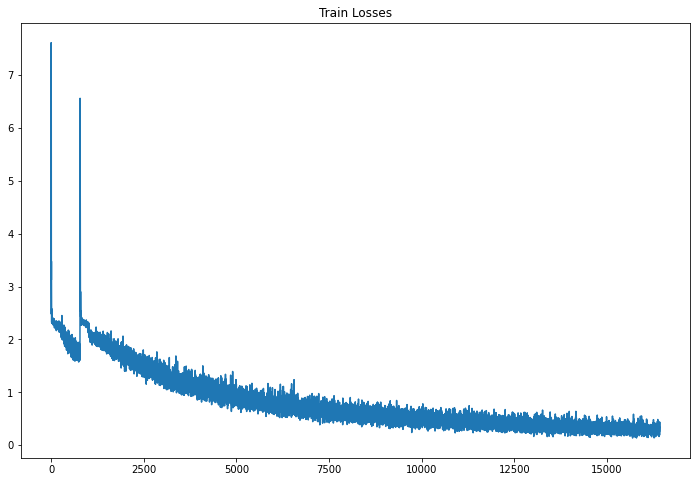

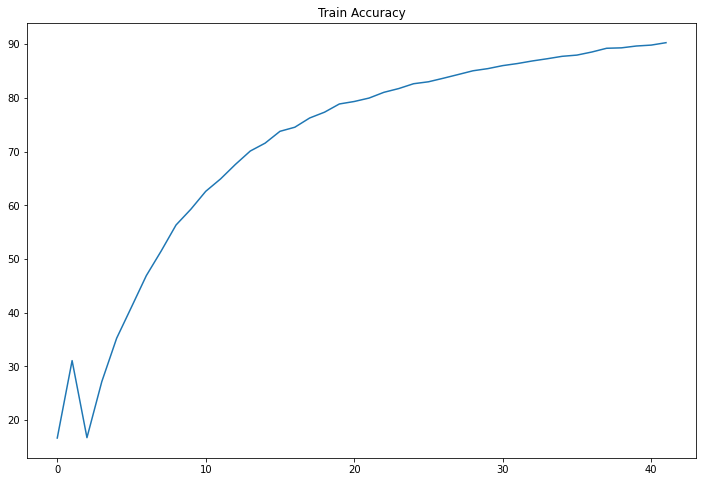

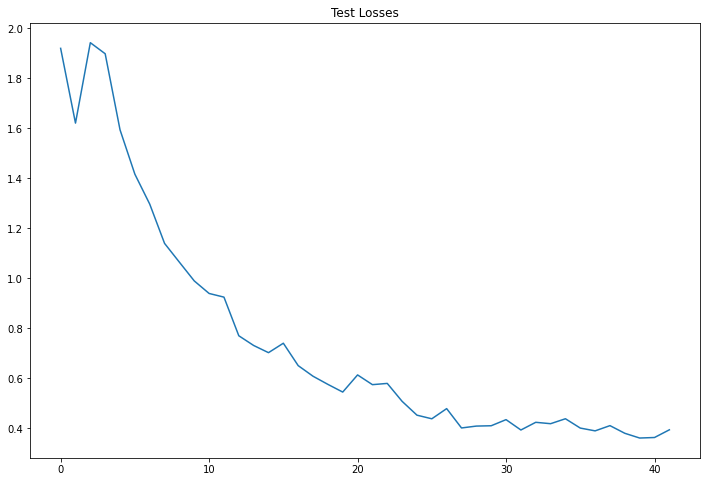

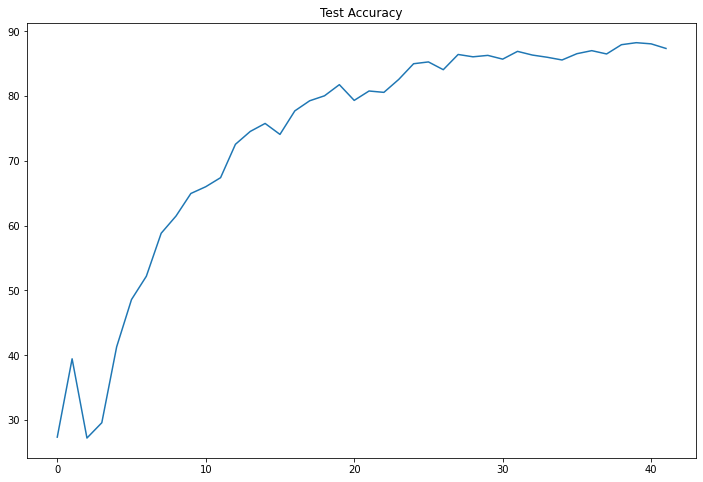

In [28]:
figure = plt.figure(figsize=(12,8))

plt.title(f"Train Losses")
plt.plot(details['train_loss'])

figure = plt.figure(figsize=(12,8))

plt.title(f"Train Accuracy")
plt.plot(details['train_acc'])

figure = plt.figure(figsize=(12,8))

plt.title(f"Test Losses")
plt.plot(details['test_loss'])

figure = plt.figure(figsize=(12,8))

plt.title(f"Test Accuracy")
plt.plot(details['test_acc'])